In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [4]:
from FPLPredictor import FPLPredictor

In [5]:
#add this info to a settings dict?
stats_current_gameweek = 12
picks_current_gameweek = 12
current_season = 20252026

In [6]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146764 entries, 0 to 146763
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.1+ MB


In [7]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131882,Bukayo Saka,1.0,3.0,Man Utd
131883,Bukayo Saka,2.0,6.0,Leeds
131768,Bukayo Saka,3.0,0.0,Liverpool
131771,Bukayo Saka,4.0,0.0,Nott'm Forest
131774,Bukayo Saka,5.0,1.0,Man City
131777,Bukayo Saka,6.0,2.0,Newcastle
131780,Bukayo Saka,7.0,8.0,West Ham
131884,Bukayo Saka,8.0,7.0,Fulham
131885,Bukayo Saka,9.0,3.0,Crystal Palace
131887,Bukayo Saka,10.0,3.0,Burnley


In [8]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [9]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7418/13826

Training Set Performance:
R² Score: 0.8011
RMSE: 16.2631
MAE: 11.7894

Test Set Performance:
R² Score: 0.5303
RMSE: 25.5621
MAE: 18.1245

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.532359
                          minutes_elo_adj_running_avg_prev_3    0.094039
                    goals_scored_elo_adj_running_avg_prev_10    0.007746
                                                opp_team_elo    0.007213
                                                    elo_diff    0.007125
                             opp_team_elo_running_avg_prev_3    0.006957
                            opp_team_elo_running_avg_prev_10    0.006930
                                 minutes_running_avg_prev_10    0.006687
                                     bps_running_avg_prev_10    0.006163
                             opp_team_elo_running_avg_prev_5    0.005473
          

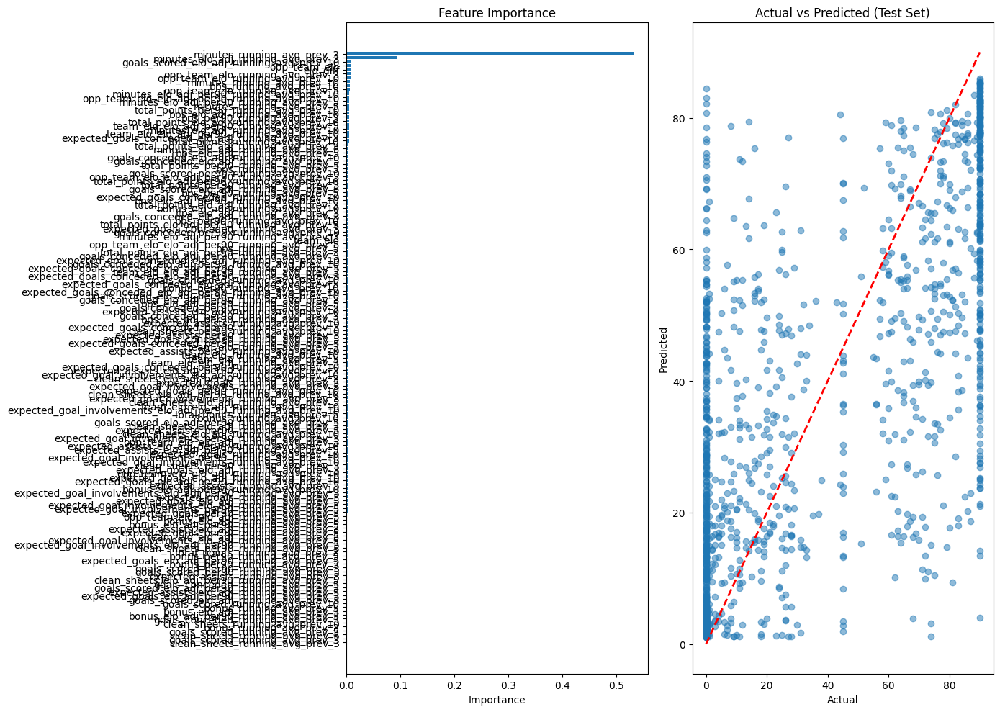

Cleaned df size: 28653/49821

Training Set Performance:
R² Score: 0.6768
RMSE: 21.8120
MAE: 16.0118

Test Set Performance:
R² Score: 0.5278
RMSE: 26.3424
MAE: 19.1450

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.723190
                          minutes_elo_adj_running_avg_prev_3    0.024885
                                     bps_running_avg_prev_10    0.009980
                                  minutes_running_avg_prev_5    0.006585
                                 minutes_running_avg_prev_10    0.006457
                          minutes_elo_adj_running_avg_prev_5    0.006098
                            opp_team_elo_running_avg_prev_10    0.004815
                                                    elo_diff    0.004481
                                                opp_team_elo    0.004457
                             opp_team_elo_running_avg_prev_3    0.004125
         

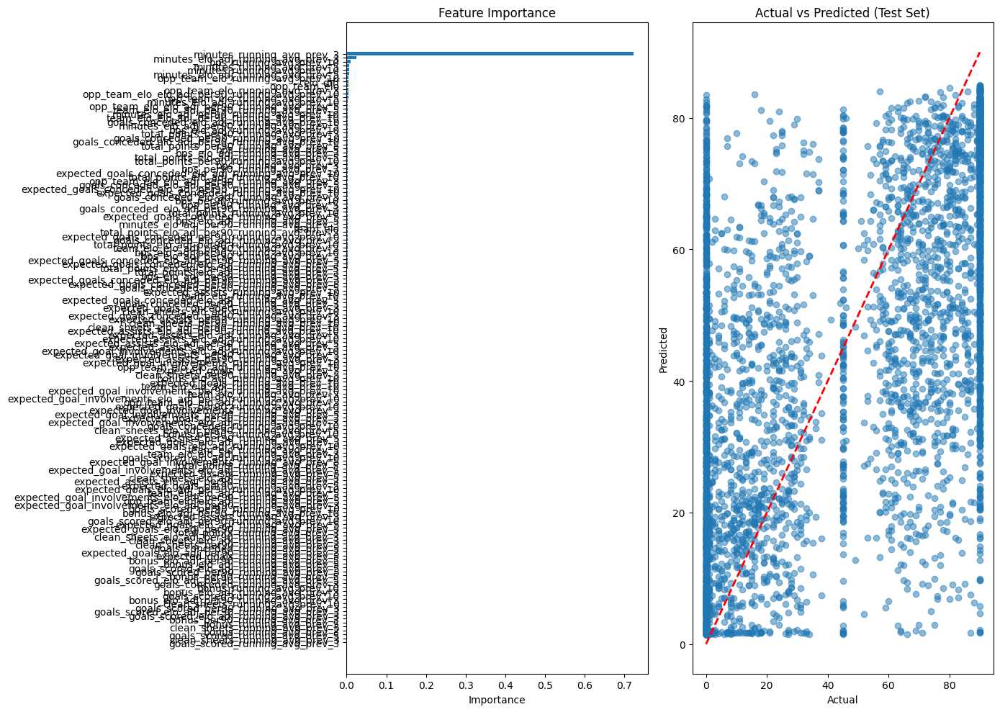

Cleaned df size: 21720/39035

Training Set Performance:
R² Score: 0.6435
RMSE: 25.1910
MAE: 18.6109

Test Set Performance:
R² Score: 0.4735
RMSE: 30.6088
MAE: 22.6136

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.706087
                          minutes_elo_adj_running_avg_prev_3    0.014651
                                 minutes_running_avg_prev_10    0.007360
                            opp_team_elo_running_avg_prev_10    0.006793
                                                opp_team_elo    0.006677
                             opp_team_elo_running_avg_prev_3    0.006528
                             opp_team_elo_running_avg_prev_5    0.005641
                                                    elo_diff    0.005439
                                     bps_running_avg_prev_10    0.005085
                                  minutes_running_avg_prev_5    0.004823
         

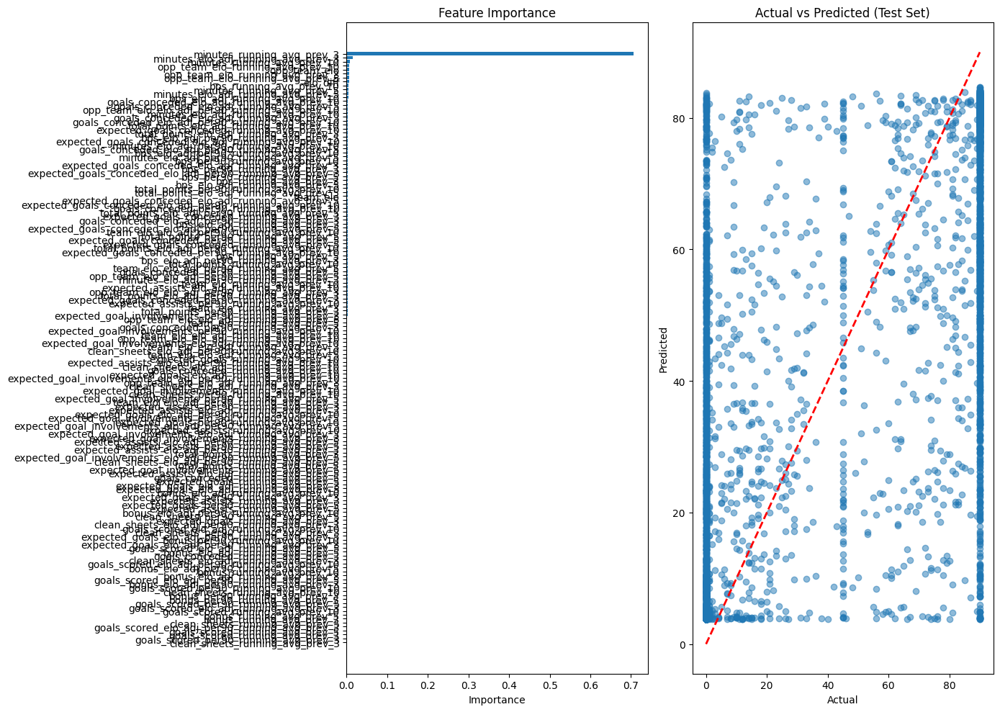

Cleaned df size: 4645/8287

Training Set Performance:
R² Score: 0.8378
RMSE: 18.0152
MAE: 10.2108

Test Set Performance:
R² Score: 0.6871
RMSE: 25.0235
MAE: 14.7379

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.421193
                     total_points_elo_adj_running_avg_prev_3    0.117909
                          minutes_elo_adj_running_avg_prev_3    0.058760
                             total_points_running_avg_prev_3    0.054658
                       total_points_per90_running_avg_prev_3    0.041284
               total_points_elo_adj_per90_running_avg_prev_3    0.023480
                        bps_elo_adj_per90_running_avg_prev_3    0.010815
                            opp_team_elo_running_avg_prev_10    0.010382
                                                opp_team_elo    0.009521
                             opp_team_elo_running_avg_prev_3    0.009503
           

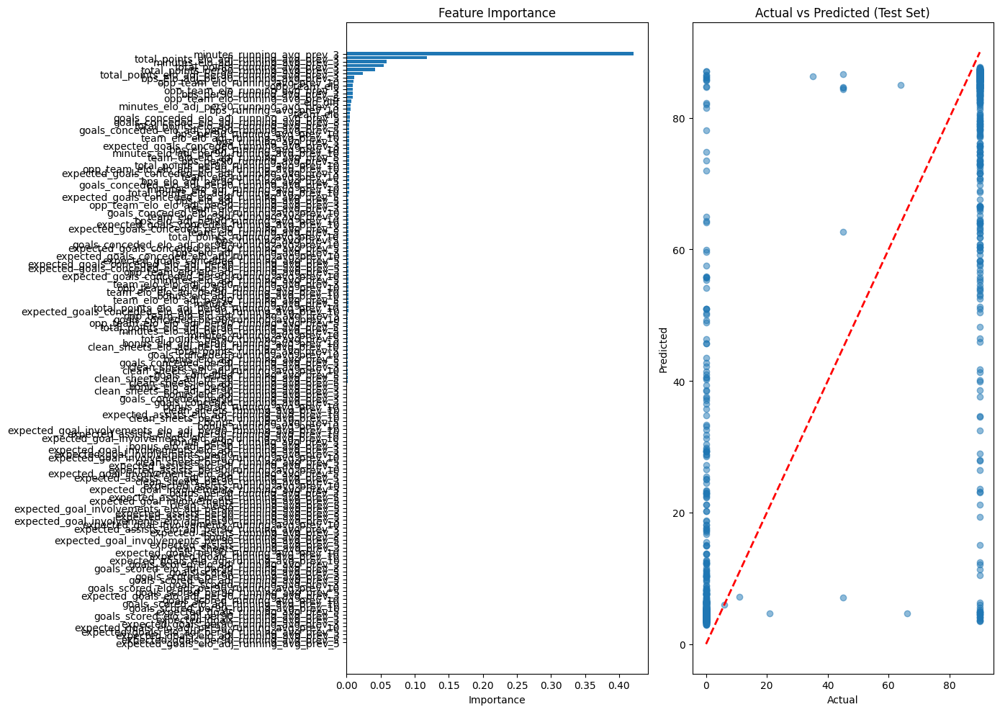

In [10]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2370/4089

Training Set Performance:
R² Score: 0.6257
RMSE: 0.2778
MAE: 0.2109

Test Set Performance:
R² Score: 0.1374
RMSE: 0.4105
MAE: 0.3001

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.050965
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.041014
                                                opp_team_elo    0.026993
        expected_goal_involvements_per90_running_avg_prev_10    0.019013
          expected_assists_elo_adj_per90_running_avg_prev_10    0.016680
         expected_goal_involvements_per90_running_avg_prev_3    0.014612
                                 minutes_running_avg_prev_10    0.012871
       expected_goal_involvements_elo_adj_running_avg_prev_3    0.012682
       expected_goal_involvements_elo_adj_running_avg_prev_5    0.012439
              goals_scored_elo_adj_per90_r

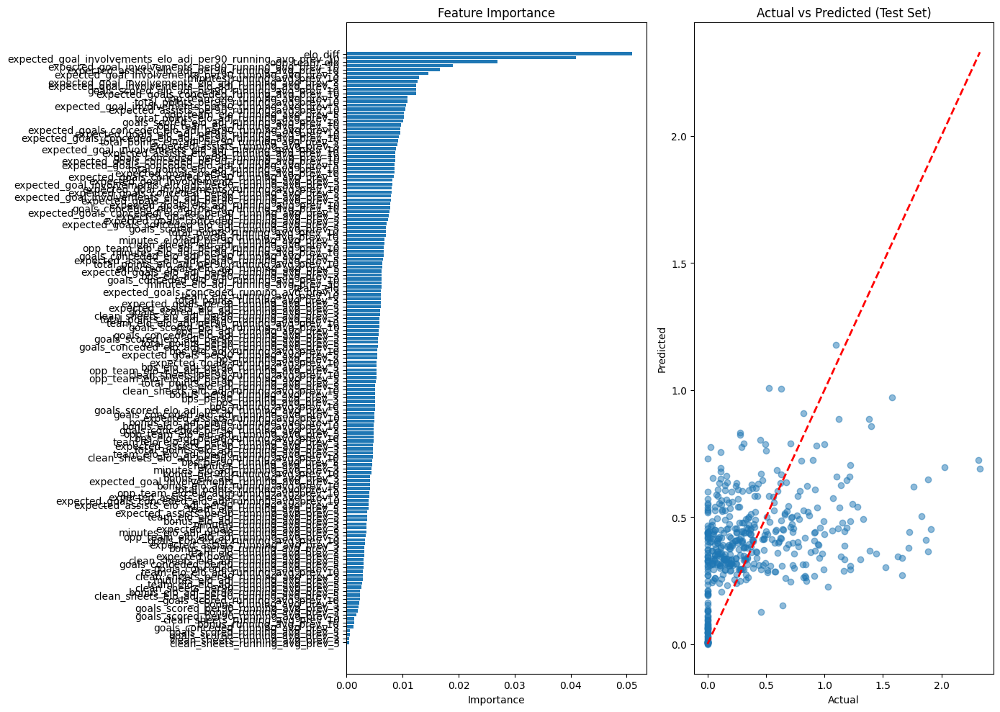

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10627/16928

Training Set Performance:
R² Score: 0.5503
RMSE: 0.1735
MAE: 0.1140

Test Set Performance:
R² Score: 0.0959
RMSE: 0.2233
MAE: 0.1416

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.124787
                    expected_goals_per90_running_avg_prev_10    0.083595
                                                opp_team_elo    0.038307
                  expected_goals_elo_adj_running_avg_prev_10    0.027795
            expected_goals_elo_adj_per90_running_avg_prev_10    0.023880
                             opp_team_elo_running_avg_prev_5    0.020044
              expected_goal_involvements_running_avg_prev_10    0.016781
                                                    elo_diff    0.015435
                             opp_team_elo_running_avg_prev_3    0.013282
        expected_goal_involvements_per90

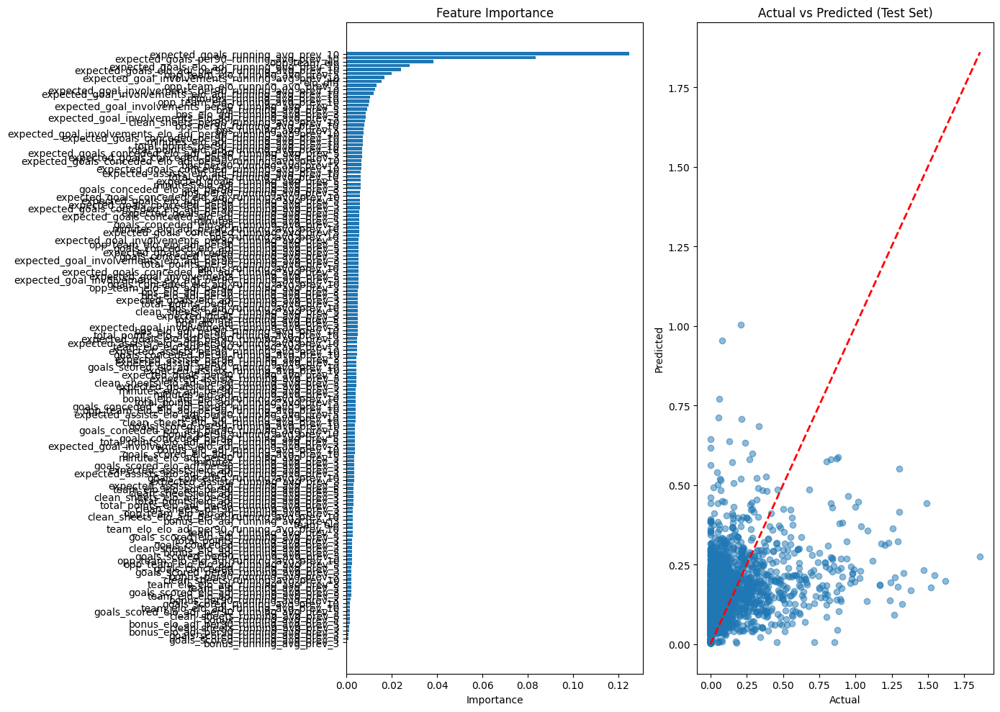

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9133/14929

Training Set Performance:
R² Score: 0.3391
RMSE: 0.0935
MAE: 0.0538

Test Set Performance:
R² Score: -0.0037
RMSE: 0.1185
MAE: 0.0631

Feature Importance:
                                                     feature  importance
            expected_goals_elo_adj_per90_running_avg_prev_10    0.039350
                                                opp_team_elo    0.029752
                  expected_goals_elo_adj_running_avg_prev_10    0.027263
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.021694
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.019308
                  expected_goals_conceded_running_avg_prev_3    0.019201
                 expected_goals_conceded_running_avg_prev_10    0.018253
                          expected_goals_running_avg_prev_10    0.018184
            expected_goals_conceded_per90_running_avg_prev_5    0.018181
                             opp_team_el

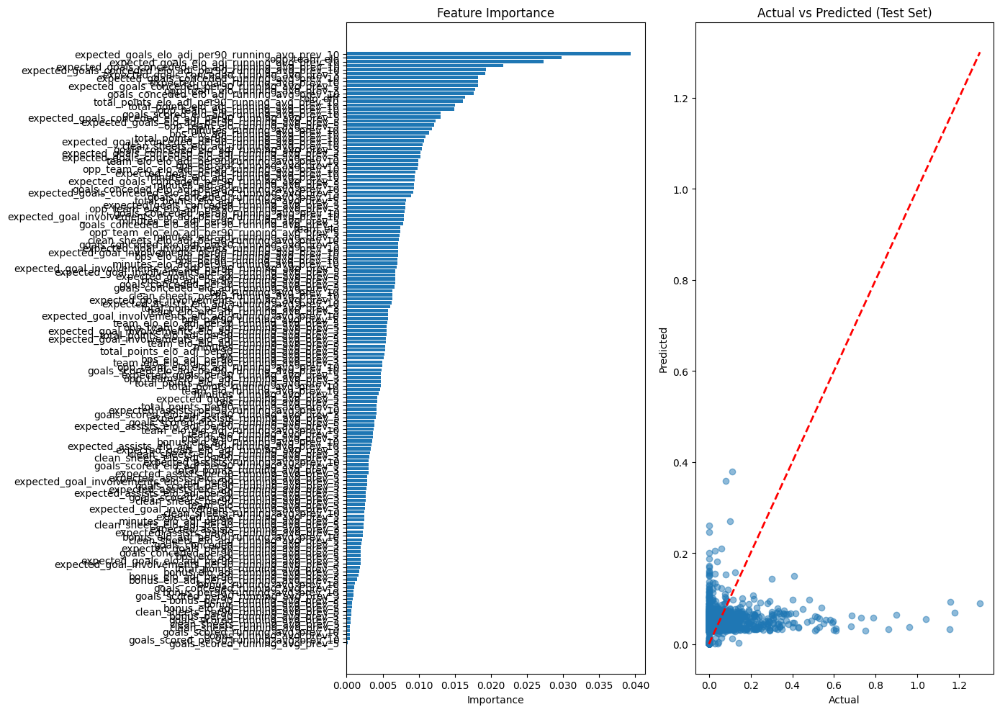

In [11]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2370/4089

Training Set Performance:
R² Score: 0.6115
RMSE: 0.0789
MAE: 0.0521

Test Set Performance:
R² Score: 0.0128
RMSE: 0.1167
MAE: 0.0758

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.077583
                                                opp_team_elo    0.036747
          expected_assists_elo_adj_per90_running_avg_prev_10    0.033789
                 expected_assists_elo_adj_running_avg_prev_3    0.028687
                        expected_assists_running_avg_prev_10    0.021305
                                                    elo_diff    0.016892
                             opp_team_elo_running_avg_prev_3    0.016582
                  expected_assists_per90_running_avg_prev_10    0.016507
                             opp_team_elo_running_avg_prev_5    0.015969
                 expected_assists_elo_ad

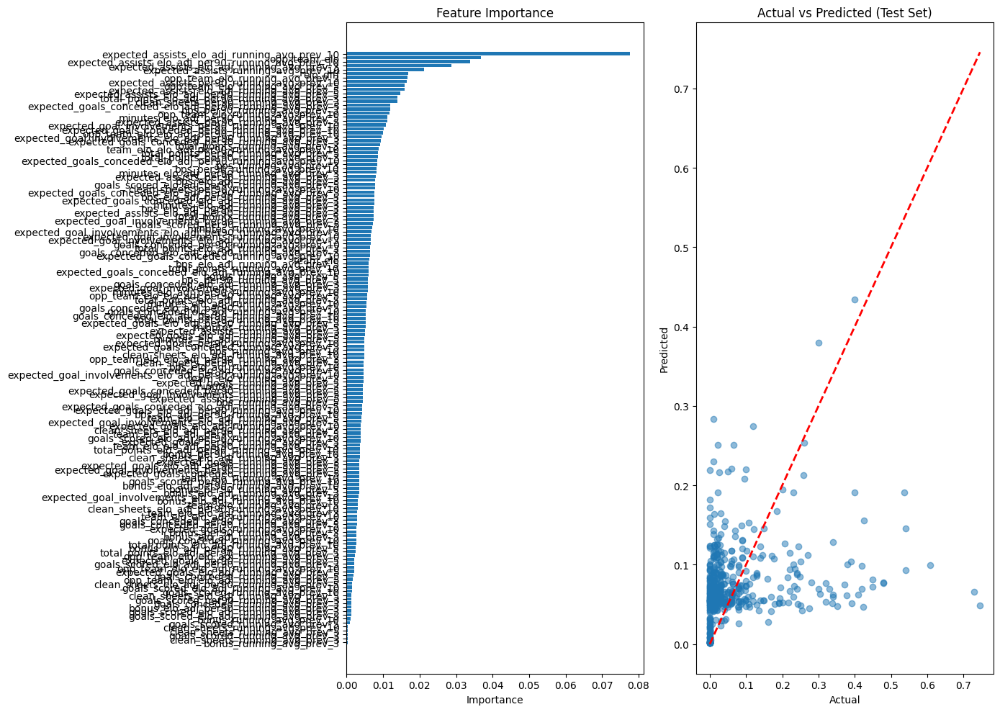

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10627/16928

Training Set Performance:
R² Score: 0.4831
RMSE: 0.1167
MAE: 0.0791

Test Set Performance:
R² Score: 0.1590
RMSE: 0.1526
MAE: 0.0981

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.088393
                expected_assists_elo_adj_running_avg_prev_10    0.071751
                  expected_assists_per90_running_avg_prev_10    0.052582
                                                    elo_diff    0.050821
                        expected_assists_running_avg_prev_10    0.034191
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.033932
                                                opp_team_elo    0.031529
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.018970
                            opp_team_elo_running_avg_prev_10    0.012900
                                 minut

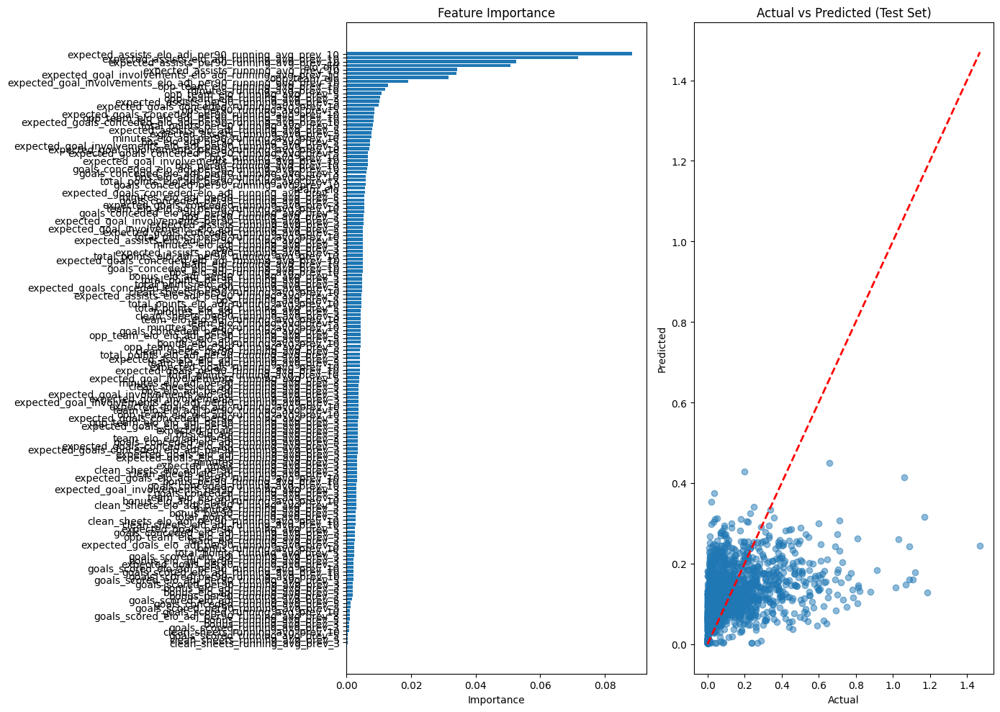

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9133/14929

Training Set Performance:
R² Score: 0.4818
RMSE: 0.0753
MAE: 0.0442

Test Set Performance:
R² Score: 0.0407
RMSE: 0.0991
MAE: 0.0531

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.087113
          expected_assists_elo_adj_per90_running_avg_prev_10    0.086783
                  expected_assists_per90_running_avg_prev_10    0.046803
                                                opp_team_elo    0.038233
                        expected_assists_running_avg_prev_10    0.033730
                             opp_team_elo_running_avg_prev_3    0.024090
           expected_assists_elo_adj_per90_running_avg_prev_5    0.021216
                 expected_assists_elo_adj_running_avg_prev_5    0.019293
                                                    elo_diff    0.016937
           expected_goals_conceded_per9

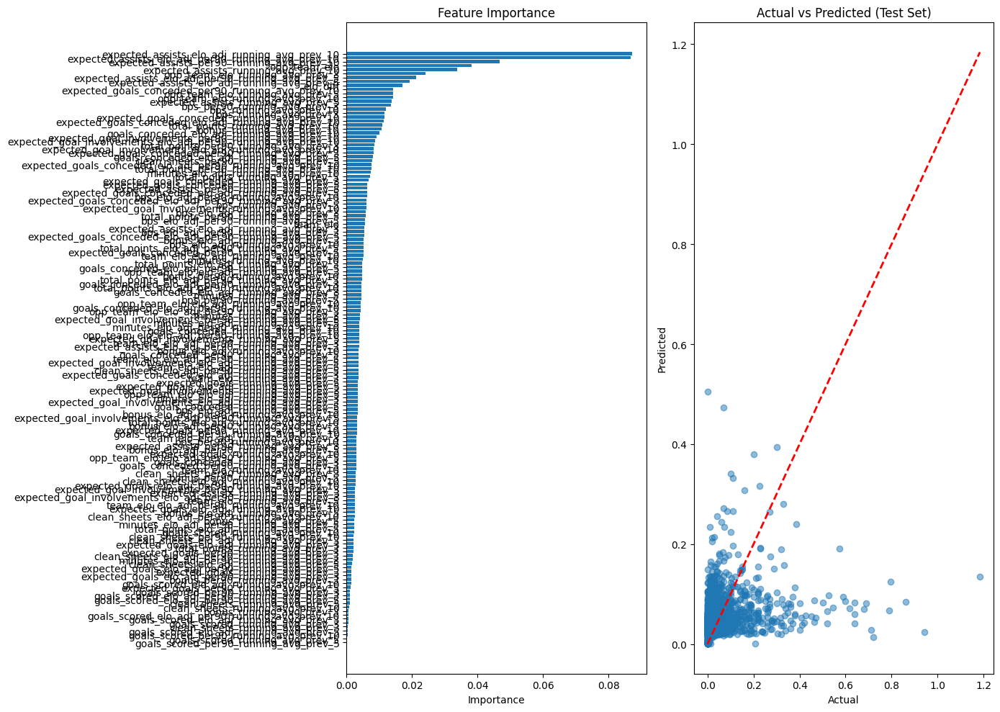

In [12]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2370/4089

Training Set Performance:
R² Score: 0.7501
RMSE: 0.4709
MAE: 0.3667

Test Set Performance:
R² Score: 0.2857
RMSE: 0.7934
MAE: 0.6003

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.173579
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.081719
           expected_goals_conceded_per90_running_avg_prev_10    0.056753
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.037431
                  expected_goals_conceded_running_avg_prev_5    0.025793
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.024684
            expected_goals_conceded_per90_running_avg_prev_5    0.022866
                                                opp_team_elo    0.020476
                 expected_goals_conceded_running_avg_prev_10    0.017115
                            opp_

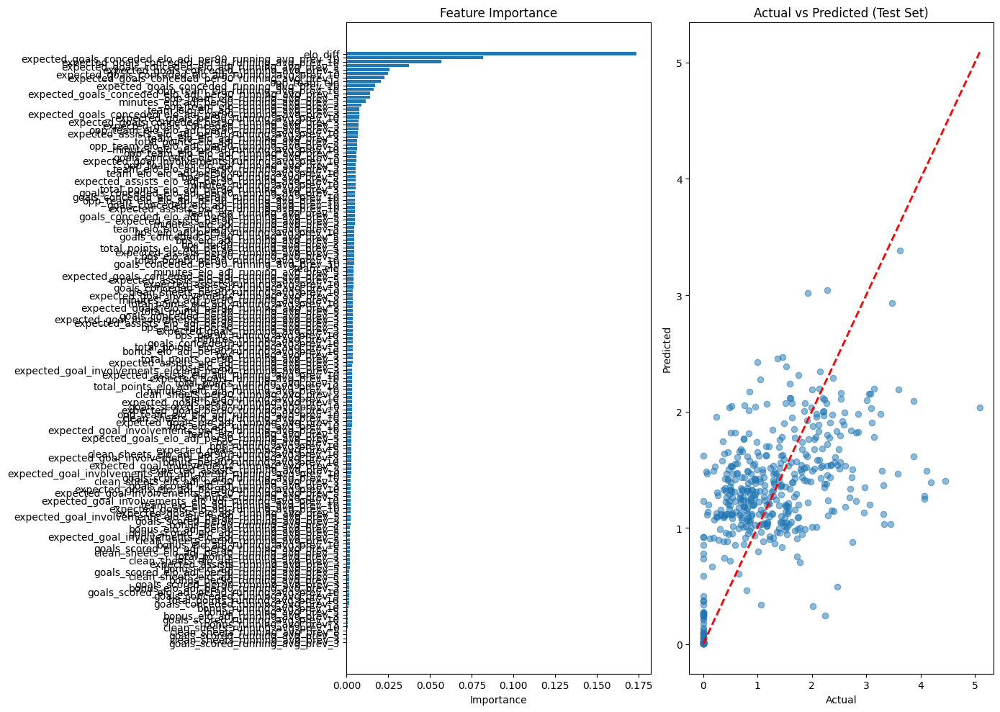

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10627/16928

Training Set Performance:
R² Score: 0.6304
RMSE: 0.5800
MAE: 0.4392

Test Set Performance:
R² Score: 0.4683
RMSE: 0.6918
MAE: 0.5202

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.252354
           expected_goals_conceded_per90_running_avg_prev_10    0.153082
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.068314
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.055302
                 expected_goals_conceded_running_avg_prev_10    0.046361
                             opp_team_elo_running_avg_prev_5    0.024487
                                                opp_team_elo    0.021813
                             opp_team_elo_running_avg_prev_3    0.020933
                            opp_team_elo_running_avg_prev_10    0.018544
          expected_goals_conce

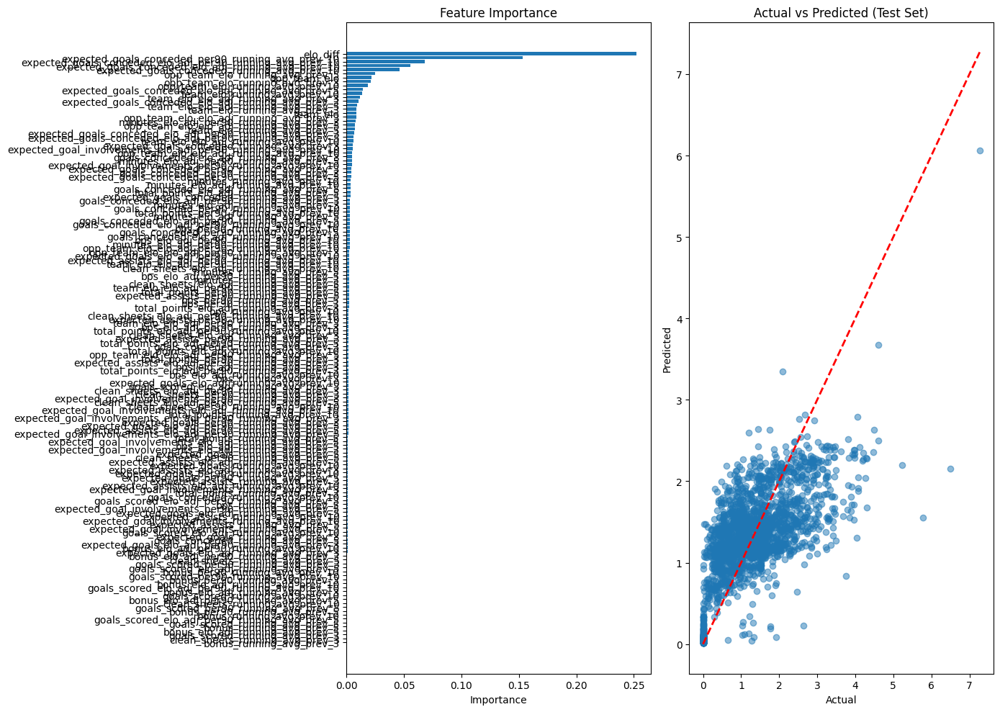

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9133/14929

Training Set Performance:
R² Score: 0.6568
RMSE: 0.5536
MAE: 0.4195

Test Set Performance:
R² Score: 0.4439
RMSE: 0.7295
MAE: 0.5039

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.235079
           expected_goals_conceded_per90_running_avg_prev_10    0.133876
                 expected_goals_conceded_running_avg_prev_10    0.083688
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.068669
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.041462
                                                opp_team_elo    0.024003
                            opp_team_elo_running_avg_prev_10    0.023444
                             opp_team_elo_running_avg_prev_5    0.020630
                             opp_team_elo_running_avg_prev_3    0.020393
                               

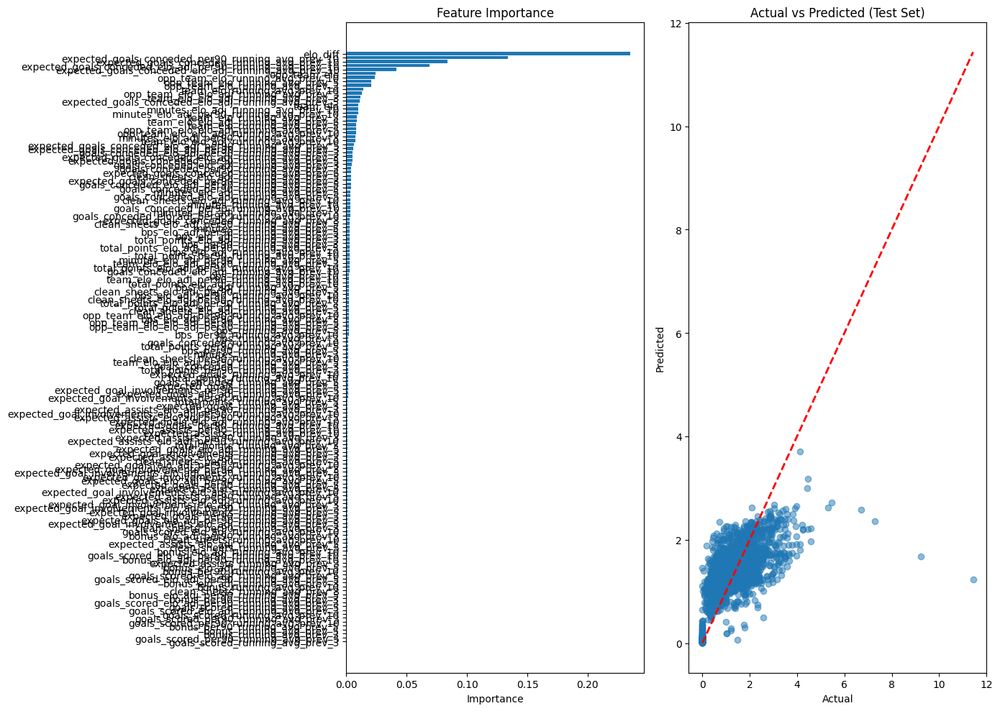

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2261/3643

Training Set Performance:
R² Score: 0.7154
RMSE: 0.4869
MAE: 0.3748

Test Set Performance:
R² Score: 0.3630
RMSE: 0.7742
MAE: 0.5827

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.214861
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.123255
           expected_goals_conceded_per90_running_avg_prev_10    0.075300
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.036771
                 expected_goals_conceded_running_avg_prev_10    0.030996
                   goals_conceded_elo_adj_running_avg_prev_5    0.023548
                                                opp_team_elo    0.022893
                            opp_team_elo_running_avg_prev_10    0.020065
                             opp_team_elo_running_avg_prev_5    0.015134
             goals_conceded_elo_a

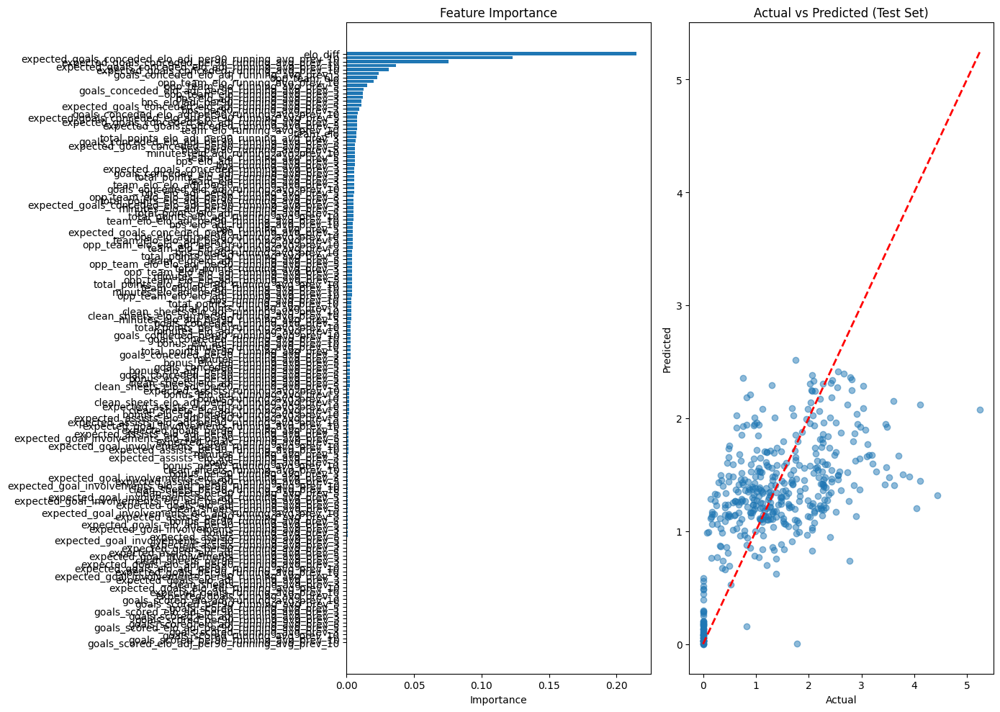

In [13]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2370/4089

Training Set Performance:
R² Score: 0.5960
RMSE: 12.4590
MAE: 10.2172

Test Set Performance:
R² Score: -0.0190
RMSE: 18.6367
MAE: 14.9271

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.052014
                                                opp_team_elo    0.025982
                            opp_team_elo_running_avg_prev_10    0.025478
                             opp_team_elo_running_avg_prev_3    0.017939
                             opp_team_elo_running_avg_prev_5    0.015480
                    minutes_elo_adj_per90_running_avg_prev_5    0.014920
                    minutes_elo_adj_per90_running_avg_prev_3    0.014739
                                     bps_running_avg_prev_10    0.014116
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.013260
                       total_points_per90_runni

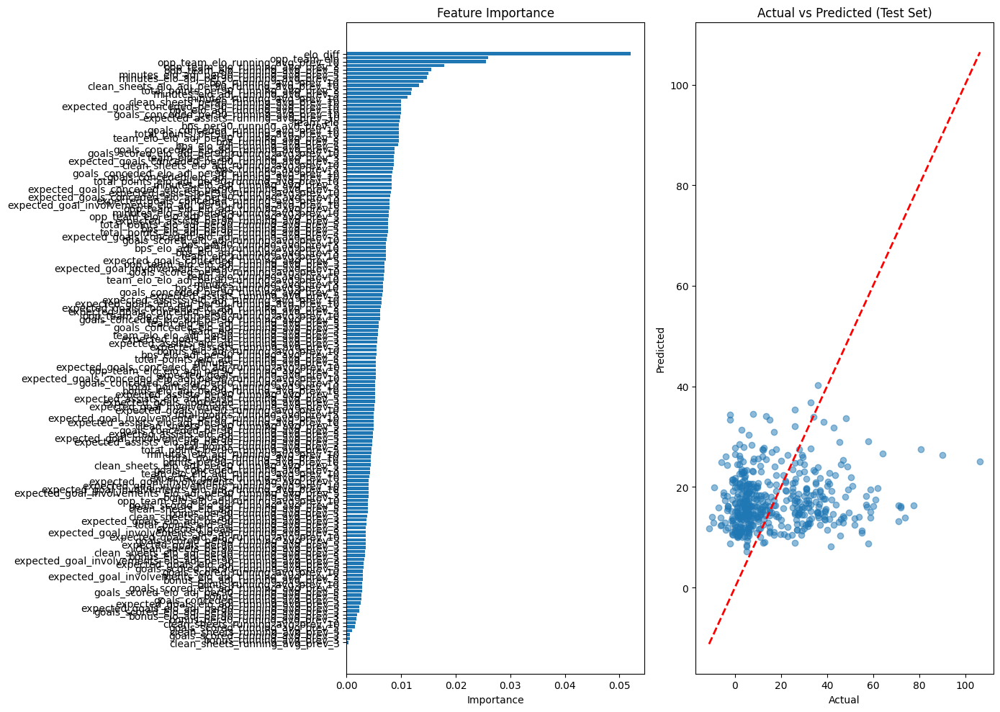

target=bps_per90, MID_bps_predictor
Cleaned df size: 10627/16928

Training Set Performance:
R² Score: 0.3984
RMSE: 9.1398
MAE: 7.0264

Test Set Performance:
R² Score: 0.0378
RMSE: 11.0754
MAE: 8.1759

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.111860
                            opp_team_elo_running_avg_prev_10    0.023232
                             opp_team_elo_running_avg_prev_5    0.022179
                expected_assists_elo_adj_running_avg_prev_10    0.019944
                                                opp_team_elo    0.019329
                        expected_assists_running_avg_prev_10    0.019111
                                     bps_running_avg_prev_10    0.017741
                             opp_team_elo_running_avg_prev_3    0.015583
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.014345
                                bps_per90_running

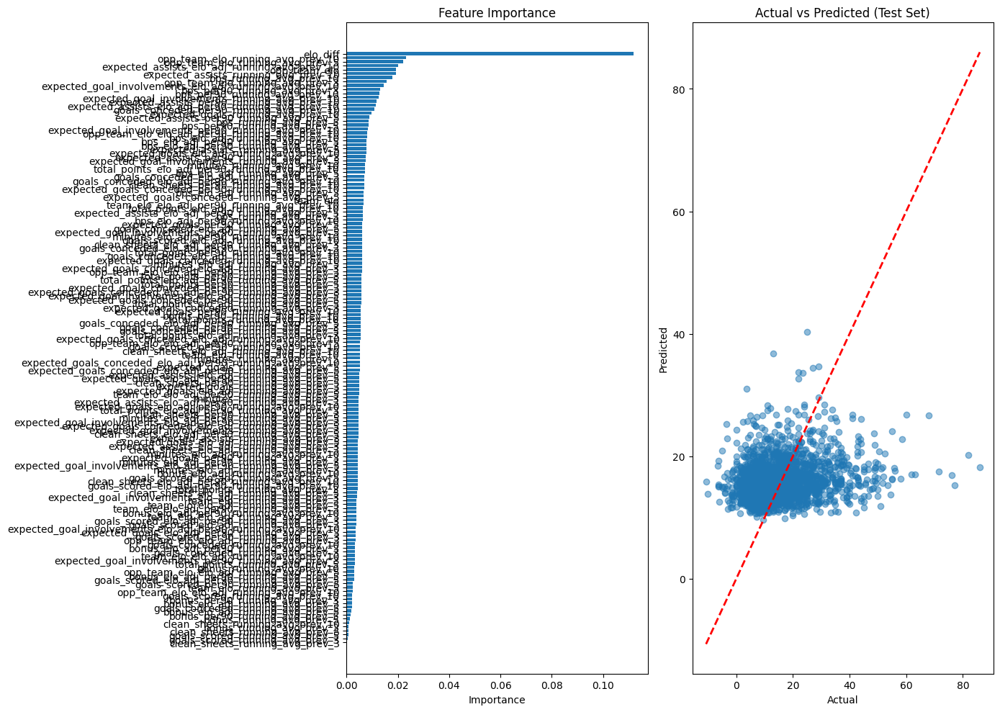

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9133/14929

Training Set Performance:
R² Score: 0.5042
RMSE: 7.1065
MAE: 5.6912

Test Set Performance:
R² Score: 0.1702
RMSE: 9.5280
MAE: 7.4524

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.199223
                                                opp_team_elo    0.028569
                             opp_team_elo_running_avg_prev_5    0.023891
                             opp_team_elo_running_avg_prev_3    0.022240
                            opp_team_elo_running_avg_prev_10    0.021988
                                team_elo_running_avg_prev_10    0.018830
                                                    team_elo    0.016174
                               bps_per90_running_avg_prev_10    0.015567
                                 team_elo_running_avg_prev_3    0.012460
                                 team_elo_running_a

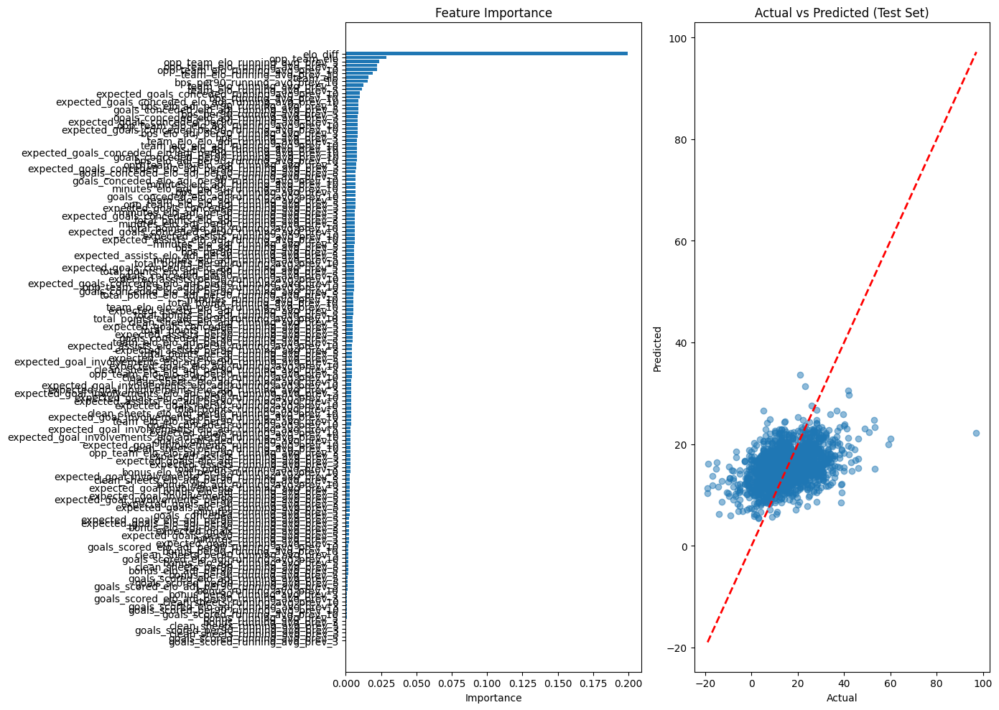

target=bps_per90, GK_bps_predictor
Cleaned df size: 2261/3643

Training Set Performance:
R² Score: 0.6360
RMSE: 5.4678
MAE: 4.4955

Test Set Performance:
R² Score: 0.0203
RMSE: 9.6278
MAE: 7.6096

Feature Importance:
                                                     feature   importance
                                                opp_team_elo 3.844721e-02
                            opp_team_elo_running_avg_prev_10 3.711124e-02
                                                    elo_diff 3.561337e-02
                               bps_per90_running_avg_prev_10 3.249875e-02
                             opp_team_elo_running_avg_prev_3 3.247511e-02
                             opp_team_elo_running_avg_prev_5 2.725941e-02
                             bps_elo_adj_running_avg_prev_10 2.102626e-02
                                     bps_running_avg_prev_10 1.941998e-02
                       bps_elo_adj_per90_running_avg_prev_10 1.789831e-02
    expected_goals_conceded_elo_adj_per90_r

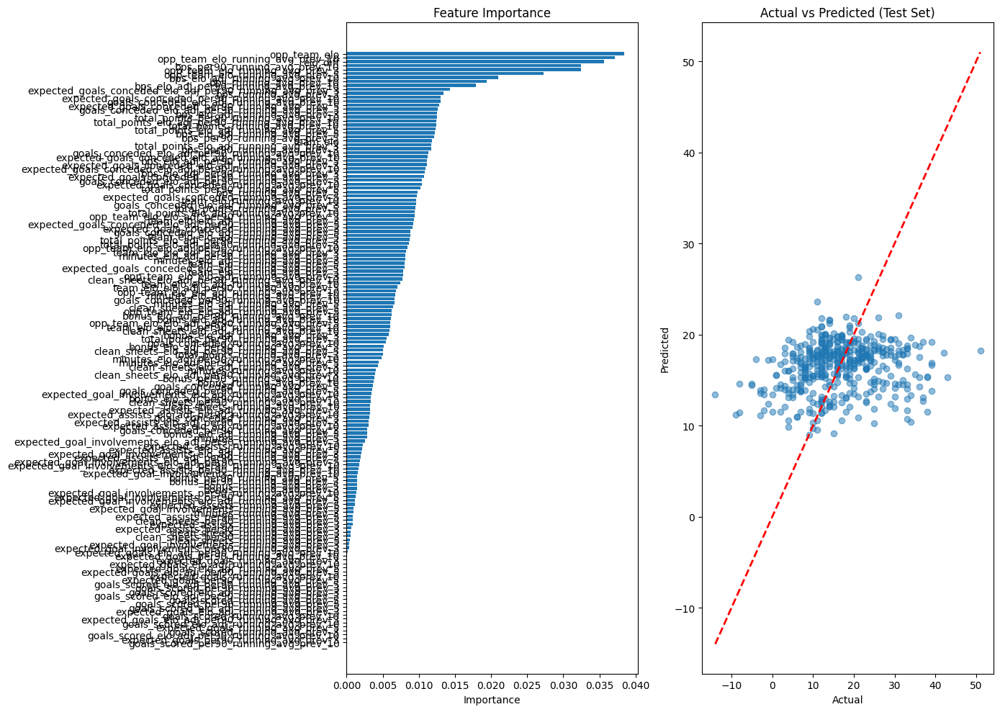

In [14]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 201/3803

Training Set Performance:
R² Score: 0.8512
RMSE: 0.6528
MAE: 0.5158

Test Set Performance:
R² Score: -0.0536
RMSE: 1.4985
MAE: 1.2246

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.099796
                  team_elo_elo_adj_per90_running_avg_prev_10    0.029517
                             opp_team_elo_running_avg_prev_5    0.028968
                            opp_team_elo_running_avg_prev_10    0.025899
                                                    team_elo    0.021988
                                                opp_team_elo    0.020452
                             opp_team_elo_running_avg_prev_3    0.019808
              opp_team_elo_elo_adj_per90_running_avg_prev_10    0.018955
                                team_elo_running_avg_prev_10    0.018898
                     saves_elo_adj_per90_running_

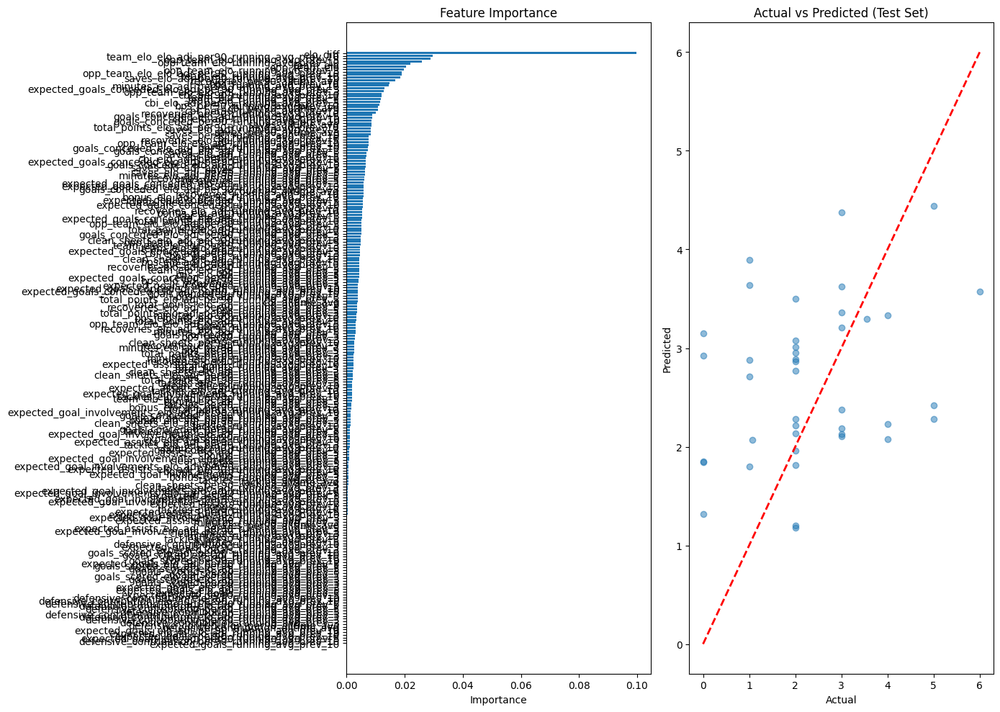

In [15]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 218/4691

Training Set Performance:
R² Score: 0.8233
RMSE: 1.1401
MAE: 0.8666

Test Set Performance:
R² Score: 0.0531
RMSE: 2.2871
MAE: 1.7012

Feature Importance:
                                                     feature  importance
                                                    team_elo    0.038878
                          tackles_elo_adj_running_avg_prev_5    0.028096
                             opp_team_elo_running_avg_prev_5    0.023503
                            opp_team_elo_running_avg_prev_10    0.022875
                   minutes_elo_adj_per90_running_avg_prev_10    0.018189
                   defensive_contribution_running_avg_prev_3    0.013565
                             opp_team_elo_running_avg_prev_3    0.013407
                                team_elo_running_avg_prev_10    0.012212
                 recoveries_elo_adj_per90_running_avg_prev_3    0.012138
                    opp_team_el

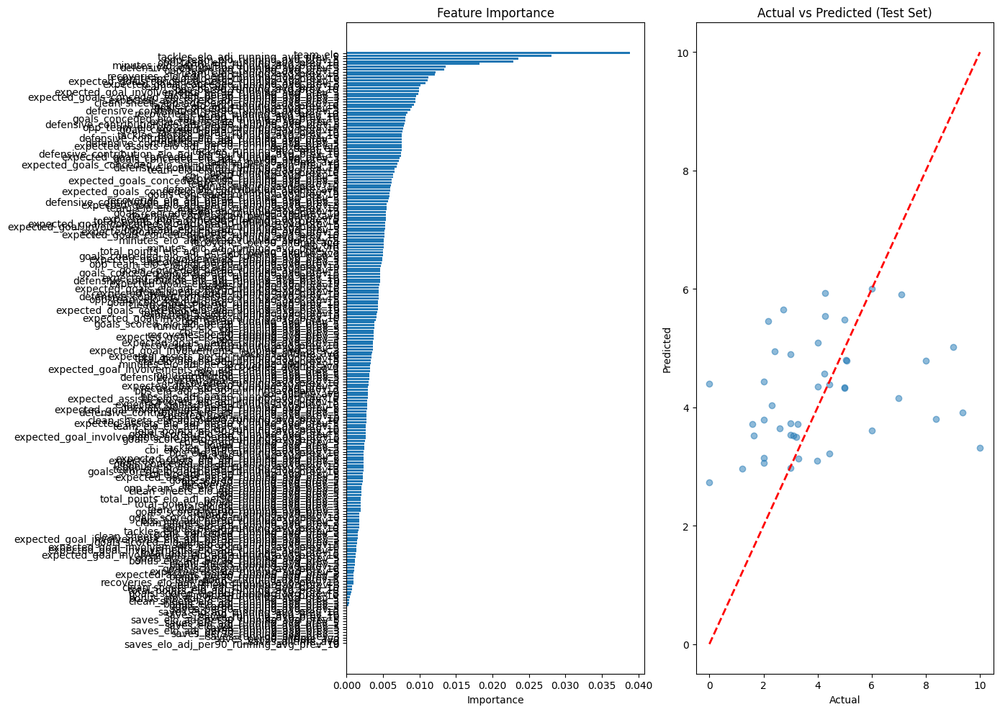

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1052/19315

Training Set Performance:
R² Score: 0.8316
RMSE: 1.6437
MAE: 1.3185

Test Set Performance:
R² Score: 0.0668
RMSE: 3.7730
MAE: 3.0564

Feature Importance:
                                                     feature  importance
                         tackles_elo_adj_running_avg_prev_10    0.033884
                           tackles_per90_running_avg_prev_10    0.029662
                   tackles_elo_adj_per90_running_avg_prev_10    0.025069
             defensive_contribution_per90_running_avg_prev_5    0.019085
                                 tackles_running_avg_prev_10    0.018623
                               cbi_per90_running_avg_prev_10    0.017765
                      total_points_per90_running_avg_prev_10    0.015497
              total_points_elo_adj_per90_running_avg_prev_10    0.014247
                                                opp_team_elo    0.014174
                             

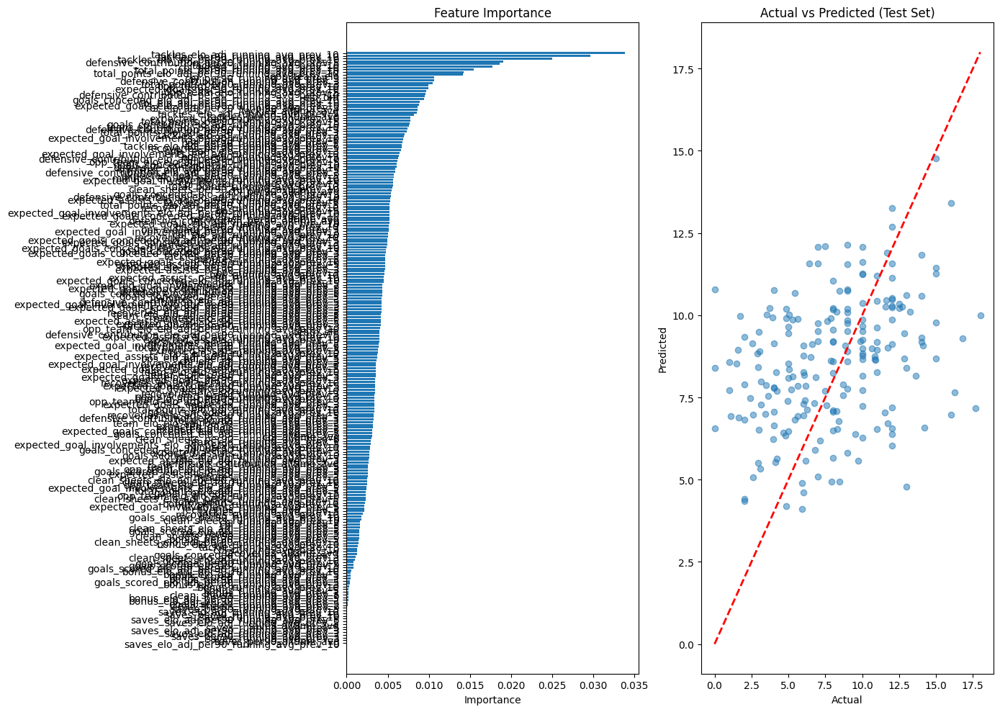

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 864/16324

Training Set Performance:
R² Score: 0.7798
RMSE: 1.7830
MAE: 1.4359

Test Set Performance:
R² Score: 0.0233
RMSE: 3.7958
MAE: 3.0050

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.038314
                                       cbi_per90_alltime_avg    0.036423
                                                opp_team_elo    0.025995
                                                    elo_diff    0.021908
                                cbi_per90_running_avg_prev_3    0.021848
                                             cbi_alltime_avg    0.017566
                                     cbi_running_avg_prev_10    0.015763
                             opp_team_elo_running_avg_prev_3    0.014411
                             cbi_elo_adj_running_avg_prev_10    0.013875
         expected_goals_conced

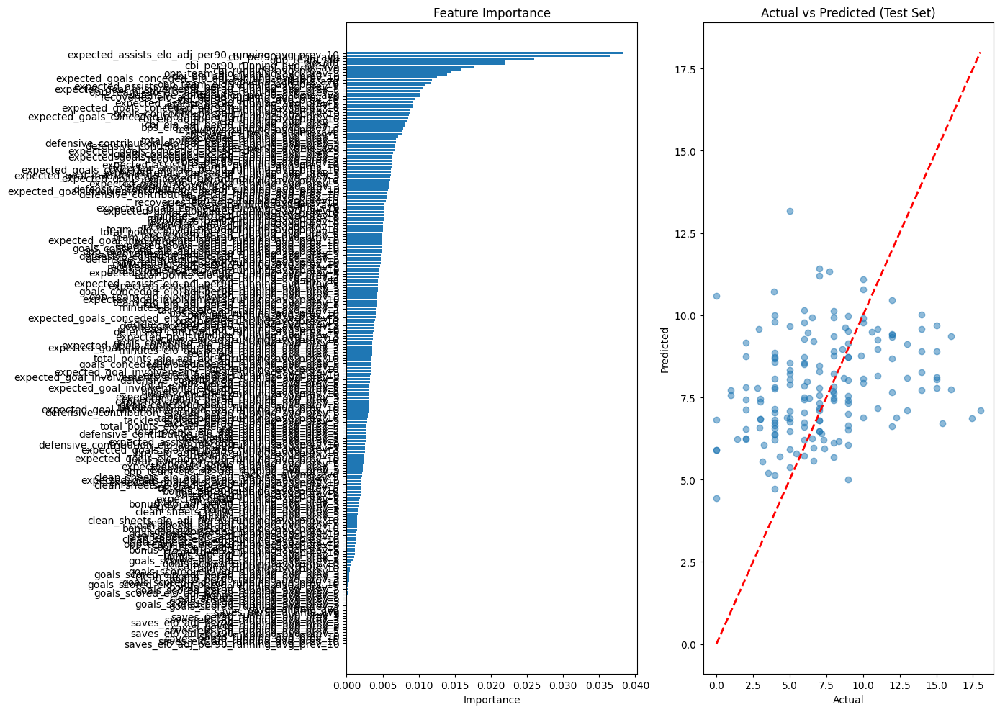

In [16]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.339


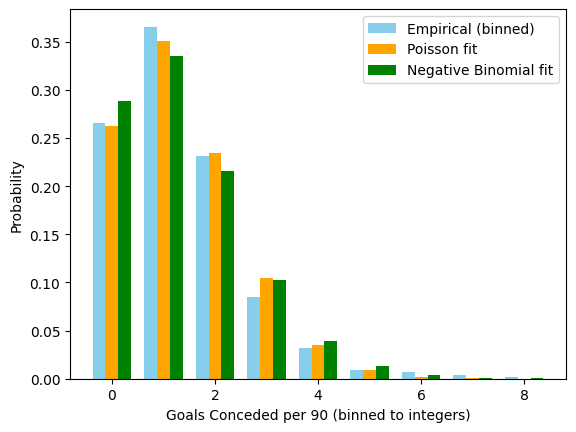

Mean: 1.332, Variance: 1.525
Overdispersion ratio (Var/Mean): 1.145
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.203


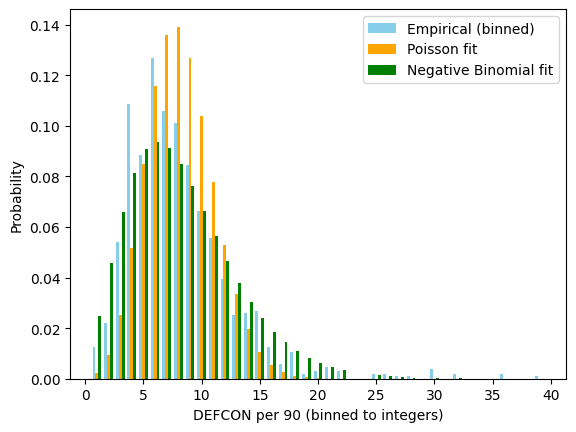

Mean: 8.198, Variance: 21.930
Overdispersion ratio (Var/Mean): 2.675
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [18]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.219


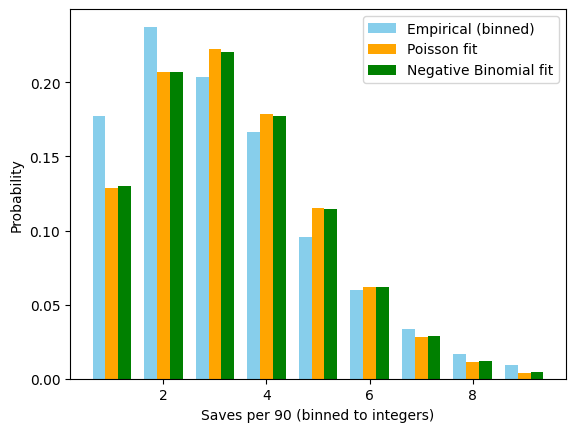

Mean: 3.219, Variance: 3.277
Overdispersion ratio (Var/Mean): 1.018
✅ Poisson assumption looks reasonable.


In [19]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.175e+04
Date:                Sat, 22 Nov 2025   Prob (F-statistic):                        0.00
Time:                        14:35:27   Log-Likelihood:                         -37213.
No. Observations:               39468   AIC:                                  7.443e+04
Df Residuals:                   39467   BIC:                                  7.444e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

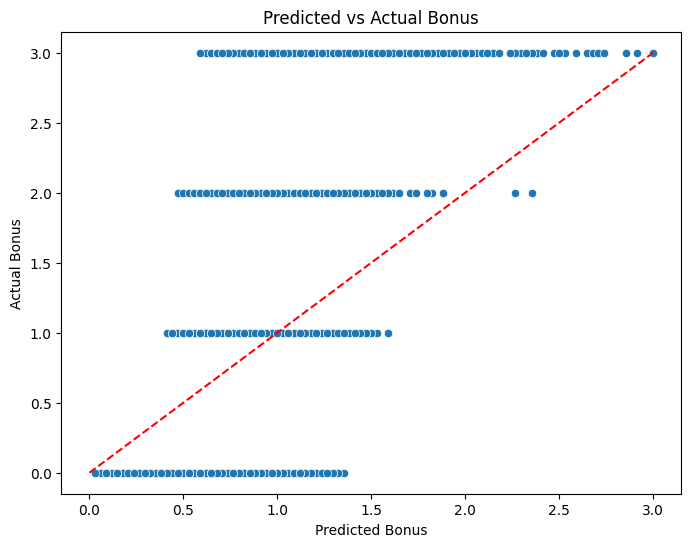

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459331  0.232705  1.110693  1.953837
FWD           0.332300  0.201286  1.049755  1.712193
GK            0.491844  0.247131  1.119275  2.014529
GKP                NaN       NaN       NaN       NaN
MID           0.393570  0.247999  1.052868  1.829720


In [20]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [21]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [22]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
13.0,0
14.0,0
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0
21.0,0


In [23]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [24]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    11700.000000
mean        32.617043
std         22.856953
min          1.180039
25%          9.890224
50%         28.831176
75%         54.911556
max         75.299040
Name: mins_pred, dtype: float64

In [25]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    10946.000000
mean         0.133163
std          0.119746
min          0.004357
25%          0.047296
50%          0.086887
75%          0.178117
max          1.096822
Name: xgp90_pred, dtype: float64

In [26]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    10946.000000
mean         0.081436
std          0.049301
min          0.008730
25%          0.042657
50%          0.071683
75%          0.109081
max          0.334582
Name: xap90_pred, dtype: float64

In [27]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    11700.000000
mean         1.435294
std          0.386633
min          0.451655
25%          1.156359
50%          1.367777
75%          1.693147
max          2.626736
Name: xgcp90_pred, dtype: float64

In [28]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    11700.000000
mean        15.386949
std          3.297488
min          6.535686
25%         13.028779
50%         15.175852
75%         17.337662
max         34.353945
Name: xbpsp90_pred, dtype: float64

In [29]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    754.000000
mean       2.688768
std        0.636568
min        1.664728
25%        2.205609
50%        2.639879
75%        3.133995
max        4.368037
Name: xsavesp90_pred, dtype: float64

In [30]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    10946.000000
mean         7.684268
std          1.957662
min          2.982374
25%          6.763552
50%          7.872960
75%          8.932373
max         14.659050
Name: xdefconp90_pred, dtype: float64

In [31]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129658,Ben Winterburn,96.0,45.0,Bournemouth,MID,20252026.0,24.0,Wolves,927.743430,2.065803,0.250847,0.199894,1.783171
129750,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,23.0,Nott'm Forest,1020.155385,1.945728,0.185336,0.035804,1.463283
129822,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,24.0,Aston Villa,1137.727141,1.931950,0.185199,0.035543,1.644997
129875,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,13.0,Man Utd,1056.034467,22.753270,0.091323,0.185665,1.431982
129877,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,14.0,Burnley,895.747010,22.469512,0.111924,0.212573,0.867813


In [32]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
134267,Erling Haaland,430.0,149.0,Man City,FWD,20252026.0,13.0,Leeds,922.657325,60.529979,0.982767,0.089081,0.802688
145981,Viktor Gyökeres,666.0,88.0,Arsenal,FWD,20252026.0,13.0,Chelsea,1144.719414,41.042452,0.740499,0.126040,1.192412
135750,Hugo Ekitiké,661.0,86.0,Liverpool,FWD,20252026.0,13.0,West Ham,978.277514,47.680473,0.561982,0.081005,0.884842
133035,Danny Welbeck,178.0,65.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1020.155385,47.749378,0.498761,0.073533,1.202721
138326,João Pedro Junqueira de Jesus,249.0,75.0,Chelsea,FWD,20252026.0,13.0,Arsenal,1244.506645,60.318141,0.478307,0.200076,1.908433
138554,Junior Kroupi,100.0,46.0,Bournemouth,FWD,20252026.0,13.0,Sunderland,1041.633043,28.115546,0.477999,0.052055,1.408432
133726,Eddie Nketiah,284.0,54.0,Crystal Palace,FWD,20252026.0,13.0,Man Utd,1056.034467,5.135521,0.477424,0.129955,1.757276
130043,Alexander Isak,499.0,104.0,Liverpool,FWD,20252026.0,13.0,West Ham,978.277514,3.438618,0.469654,0.112862,1.237255
132219,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1020.155385,9.812040,0.467673,0.111214,1.306953
137274,Jean-Philippe Mateta,283.0,81.0,Crystal Palace,FWD,20252026.0,13.0,Man Utd,1056.034467,55.457768,0.449023,0.082187,1.287232


In [33]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [34]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [35]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_11056\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_11056\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [36]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129658,Ben Winterburn,Bournemouth,1068.336869,96.0,MID,Wolves,927.743430,20252026.0,45.0,24.0,...,1.783171,1,0.028789,0.013765,0.168104,0.000000,0.000000,0.487012,0.443494,2.141163
129680,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Burnley,895.747010,20252026.0,40.0,13.0,...,1.094592,1,0.080149,0.047532,1.338704,0.000000,-0.325298,0.541532,0.535180,3.217800
129681,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Arsenal,1244.506645,20252026.0,40.0,14.0,...,1.973979,1,0.075152,0.043848,0.555612,0.000000,-0.741775,0.541532,0.279467,1.753836
129682,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Spurs,1013.778114,20252026.0,40.0,15.0,...,1.313432,1,0.071995,0.045145,1.075583,0.000000,-0.424791,0.541532,0.418197,2.727660
129683,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Leeds,922.657325,20252026.0,40.0,16.0,...,1.082329,1,0.079933,0.047636,1.355221,0.000000,-0.319862,0.541532,0.506973,3.211434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146759,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Leeds,922.657325,20252026.0,45.0,34.0,...,1.118529,1,NaN,NaN,1.307040,0.697812,-0.335957,0.000000,0.457913,3.126808
146760,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Crystal Palace,1100.561911,20252026.0,45.0,35.0,...,1.418528,1,NaN,NaN,0.968280,0.751534,-0.473912,0.000000,0.407404,2.653307
146761,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Fulham,1016.160200,20252026.0,45.0,36.0,...,1.161739,1,NaN,NaN,1.251766,0.679397,-0.355352,0.000000,0.431006,3.006817
146762,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Man City,1229.841438,20252026.0,45.0,37.0,...,1.747579,1,NaN,NaN,0.696781,0.948112,-0.631363,0.000000,0.372638,2.386168


In [37]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
134267,Erling Haaland,430.0,149.0,Man City,FWD,13.0,Leeds,922.657325,60.529979,0.982767,0.089081,4.372480,26.786834,5.863460
138479,Joško Gvardiol,403.0,58.0,Man City,DEF,13.0,Leeds,922.657325,60.485707,0.042888,0.064895,6.801745,22.029774,5.476201
141761,Mohamed Salah,381.0,142.0,Liverpool,MID,13.0,West Ham,978.277514,67.462340,0.381355,0.182624,3.561339,22.063585,5.370652
131891,Bukayo Saka,16.0,101.0,Arsenal,MID,13.0,Chelsea,1144.719414,64.078060,0.306781,0.262008,7.676592,21.572110,5.123962
134172,Enzo Fernández,237.0,67.0,Chelsea,MID,13.0,Arsenal,1244.506645,69.826317,0.337588,0.209611,7.447484,17.129156,5.018527
135109,Gabriel dos Santos Magalhães,5.0,65.0,Arsenal,DEF,13.0,Chelsea,1144.719414,63.050221,0.123487,0.096620,9.797923,18.902769,4.956298
146018,Virgil van Dijk,373.0,60.0,Liverpool,DEF,13.0,West Ham,978.277514,60.279313,0.062269,0.043842,7.667322,23.065522,4.947809
139031,Kevin Schade,120.0,70.0,Brentford,MID,13.0,Burnley,895.747010,65.323764,0.350546,0.127658,7.658912,18.104934,4.946165
141183,Matty Cash,36.0,46.0,Aston Villa,DEF,13.0,Wolves,927.743430,62.986428,0.050946,0.064376,6.092395,19.731973,4.940872
143337,Pedro Lomba Neto,236.0,71.0,Chelsea,MID,13.0,Arsenal,1244.506645,62.085144,0.335949,0.243519,5.559871,18.601209,4.915167


In [38]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
135158,Gianluigi Donnarumma,736.0,57.0,Man City,GK,13.0,Leeds,922.657325,60.739266,2.155230,0.282733,-0.131777,0.507450,4.813636
134008,Emiliano Martínez Romero,32.0,50.0,Aston Villa,GK,13.0,Wolves,927.743430,75.299040,1.778727,0.532462,-0.204634,0.483226,4.589782
133080,David Raya Martín,1.0,59.0,Arsenal,GK,13.0,Chelsea,1144.719414,69.169837,1.370340,0.391767,-0.314959,0.563649,4.010797
131105,Bart Verbruggen,139.0,44.0,Brighton,GK,13.0,Nott'm Forest,1020.155385,65.788285,1.322061,0.483254,-0.330861,0.527334,4.001789
133190,Dean Henderson,253.0,50.0,Crystal Palace,GK,13.0,Man Utd,1056.034467,72.349751,1.272504,0.567903,-0.347955,0.495440,3.987892
131401,Bernd Leno,314.0,50.0,Fulham,GK,13.0,Spurs,1013.778114,65.607894,1.203124,0.541897,-0.373303,0.361732,3.733449


In [39]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11700 entries, 0 to 11699
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          11700 non-null  object 
 1   team_name               11700 non-null  object 
 2   team_elo                11700 non-null  float64
 3   element                 11700 non-null  float64
 4   position                11700 non-null  object 
 5   opp_team_name           11700 non-null  object 
 6   opp_team_elo            11700 non-null  float64
 7   season                  11700 non-null  float64
 8   value                   11700 non-null  float64
 9   event                   11700 non-null  float64
 10  mins_pred               11700 non-null  float64
 11  xgp90_pred              10946 non-null  float64
 12  xap90_pred              10946 non-null  float64
 13  xgcp90_pred             11700 non-null  float64
 14  xpoints_mins            11700 non-null

In [40]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [41]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [42]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 13 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
134267,Erling Haaland,430.0,13.0,149.0,Man City,FWD,Leeds,922.657325,60.529979,2,2.643860,0.179735,0.000000,0.0,0.000000,0.252332,0.787533,5.863460
138479,Joško Gvardiol,403.0,13.0,58.0,Man City,DEF,Leeds,922.657325,60.485707,2,0.172939,0.130841,2.120750,0.0,-0.137537,0.541532,0.647675,5.476201
141761,Mohamed Salah,381.0,13.0,142.0,Liverpool,MID,West Ham,978.277514,67.462340,2,1.429282,0.410676,0.395014,0.0,0.000000,0.487012,0.648669,5.370652
131891,Bukayo Saka,16.0,13.0,101.0,Arsenal,MID,Chelsea,1144.719414,64.078060,2,1.092106,0.559633,0.350992,0.0,0.000000,0.487012,0.634220,5.123962
134172,Enzo Fernández,237.0,13.0,67.0,Chelsea,MID,Arsenal,1244.506645,69.826317,2,1.309587,0.487880,0.230452,0.0,0.000000,0.487012,0.503597,5.018527
135109,Gabriel dos Santos Magalhães,5.0,13.0,65.0,Arsenal,DEF,Chelsea,1144.719414,63.050221,2,0.519059,0.203063,1.432425,0.0,-0.295523,0.541532,0.555741,4.956298
146018,Virgil van Dijk,373.0,13.0,60.0,Liverpool,DEF,West Ham,978.277514,60.279313,2,0.250236,0.088092,1.630155,0.0,-0.240332,0.541532,0.678126,4.947809
139031,Kevin Schade,120.0,13.0,70.0,Brentford,MID,Burnley,895.747010,65.323764,2,1.272167,0.277969,0.376732,0.0,0.000000,0.487012,0.532285,4.946165
141183,Matty Cash,36.0,13.0,46.0,Aston Villa,DEF,Wolves,927.743430,62.986428,2,0.213926,0.135161,1.694460,0.0,-0.224328,0.541532,0.580120,4.940872
143337,Pedro Lomba Neto,236.0,13.0,71.0,Chelsea,MID,Arsenal,1244.506645,62.085144,2,1.158748,0.503963,0.218569,0.0,0.000000,0.487012,0.546876,4.915167


In [43]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW12 - GW17


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
118,Enzo Fernández,350.246300,10,6.735981,2.528117,1.609595,0.0,0.000000,2.435059,3.103009,26.411761
57,Bukayo Saka,320.070299,10,5.353416,2.985497,2.027342,0.0,0.000000,2.435059,3.416796,26.218110
317,Mohamed Salah,336.654762,10,7.003213,2.007534,1.736073,0.0,0.000000,2.435059,2.936076,26.117954
142,Gabriel dos Santos Magalhães,314.765720,10,2.563640,1.119529,7.696623,0.0,-1.346158,2.707661,2.599772,25.341067
359,Pedro Lomba Neto,308.123071,10,5.611247,2.441344,1.603752,0.0,0.000000,2.435059,3.202497,25.293899
231,Joško Gvardiol,307.425206,10,0.804256,0.628707,8.737824,0.0,-1.101591,2.707661,3.140688,24.917545
56,Bryan Mbeumo,343.237067,10,5.369083,2.251660,1.380865,0.0,0.000000,2.435059,2.876385,24.313052
256,Leandro Trossard,320.013996,10,4.364230,1.865107,2.044070,0.0,0.000000,2.435059,2.709571,23.418037
234,Jurriën Timber,312.955871,10,1.299570,0.684032,7.620164,0.0,-1.377781,2.707661,2.432543,23.366189
93,Declan Rice,351.701846,10,3.232135,2.513925,2.043148,0.0,0.000000,2.435059,3.130922,23.355188


In [44]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
118,Enzo Fernández,1822.113023,52,35.043452,13.050135,8.020208,0.0,0.000000,12.662305,16.083783,136.859884
57,Bukayo Saka,1663.798395,52,27.425956,15.809324,10.695475,0.0,0.000000,12.662305,18.227586,136.820645
317,Mohamed Salah,1749.577312,52,36.033658,10.200897,8.595607,0.0,0.000000,12.662305,14.923820,134.416288
142,Gabriel dos Santos Magalhães,1632.457428,51,13.298977,5.942514,40.386677,0.0,-6.953959,14.079837,13.498352,131.252397
359,Pedro Lomba Neto,1599.342212,52,28.933338,12.706605,7.928907,0.0,0.000000,12.662305,16.468530,130.699685
56,Bryan Mbeumo,1778.355639,52,27.810587,11.541000,6.863312,0.0,0.000000,12.662305,14.728718,125.605923
231,Joško Gvardiol,1601.800818,51,4.095700,3.173472,41.934866,0.0,-6.638684,14.079837,15.953689,123.598879
256,Leandro Trossard,1665.956388,52,22.744681,9.851618,10.754471,0.0,0.000000,12.662305,14.335957,122.349032
93,Declan Rice,1830.524897,52,16.767614,13.314016,10.755327,0.0,0.000000,12.662305,16.766323,122.265585
234,Jurriën Timber,1619.096974,51,6.720008,3.580763,40.331791,0.0,-7.024182,14.079837,12.669689,121.357905


In [45]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 23.4 minute(s)

Finished in 7.31 minute(s)
